In [1]:
#import librares
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
import warnings
warnings.filterwarnings(action='ignore')

In [2]:
# load data
data=pd.read_csv("kidney_disease.csv")

In [3]:
data

,id,age,bp,sg,al,su,rbc,pc,pcc,ba,...,pcv,wc,rc,htn,dm,cad,appet,pe,ane,classification
0,0,48.0,80.0,1.020,1.0,0.0,NaN,normal,notpresent,notpresent,...,44,7800,5.2,yes,yes,no,good,no,no,ckd
1,1,7.0,50.0,1.020,4.0,0.0,NaN,normal,notpresent,notpresent,...,38,6000,NaN,no,no,no,good,no,no,ckd
2,2,62.0,80.0,1.010,2.0,3.0,normal,normal,notpresent,notpresent,...,31,7500,NaN,no,yes,no,poor,no,yes,ckd
3,3,48.0,70.0,1.005,4.0,0.0,normal,abnormal,present,notpresent,...,32,6700,3.9,yes,no,no,poor,yes,yes,ckd
4,4,51.0,80.0,1.010,2.0,0.0,normal,normal,notpresent,notpresent,...,35,7300,4.6,no,no,no,good,no,no,ckd
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,395,55.0,80.0,1.020,0.0,0.0,normal,normal,notpresent,notpresent,...,47,6700,4.9,no,no,no,good,no,no,notckd
396,396,42.0,70.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,...,54,7800,6.2,no,no,no,good,no,no,notckd
397,397,12.0,80.0,1.020,0.0,0.0,normal,normal,notpresent,notpresent,...,49,6600,5.4,no,no,no,good,no,no,notckd
398,398,17.0,60.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,...,51,7200,5.9,no,no,no,good,no,no,notckd


In [4]:
data.head(10)

,id,age,bp,sg,al,su,rbc,pc,pcc,ba,...,pcv,wc,rc,htn,dm,cad,appet,pe,ane,classification
0,0,48.0,80.0,1.020,1.0,0.0,NaN,normal,notpresent,notpresent,...,44,7800,5.2,yes,yes,no,good,no,no,ckd
1,1,7.0,50.0,1.020,4.0,0.0,NaN,normal,notpresent,notpresent,...,38,6000,NaN,no,no,no,good,no,no,ckd
2,2,62.0,80.0,1.010,2.0,3.0,normal,normal,notpresent,notpresent,...,31,7500,NaN,no,yes,no,poor,no,yes,ckd
3,3,48.0,70.0,1.005,4.0,0.0,normal,abnormal,present,notpresent,...,32,6700,3.9,yes,no,no,poor,yes,yes,ckd
4,4,51.0,80.0,1.010,2.0,0.0,normal,normal,notpresent,notpresent,...,35,7300,4.6,no,no,no,good,no,no,ckd
5,5,60.0,90.0,1.015,3.0,0.0,NaN,NaN,notpresent,notpresent,...,39,7800,4.4,yes,yes,no,good,yes,no,ckd
6,6,68.0,70.0,1.010,0.0,0.0,NaN,normal,notpresent,notpresent,...,36,NaN,NaN,no,no,no,good,no,no,ckd
7,7,24.0,NaN,1.015,2.0,4.0,normal,abnormal,notpresent,notpresent,...,44,6900,5,no,yes,no,good,yes,no,ckd
8,8,52.0,100.0,1.015,3.0,0.0,normal,abnormal,present,notpresent,...,33,9600,4.0,yes,yes,no,good,no,yes,ckd
9,9,53.0,90.0,1.020,2.0,0.0,abnormal,abnormal,present,notpresent,...,29,12100,3.7,yes,yes,no,poor,no,yes,ckd


In [5]:
#columns
data.columns

Index(['id', 'age', 'bp', 'sg', 'al', 'su', 'rbc', 'pc', 'pcc', 'ba', 'bgr',
       'bu', 'sc', 'sod', 'pot', 'hemo', 'pcv', 'wc', 'rc', 'htn', 'dm', 'cad',
       'appet', 'pe', 'ane', 'classification'],
      dtype='object')

In [6]:
#checking the unique Values for the Dataset columns
for i in data.drop("id",axis=1).columns:
    print('unique values in "{}":\n'.format(i),data[i].unique())

unique values in "age":
 [48.  7. 62. 51. 60. 68. 24. 52. 53. 50. 63. 40. 47. 61. 21. 42. 75. 69.
 nan 73. 70. 65. 76. 72. 82. 46. 45. 35. 54. 11. 59. 67. 15. 55. 44. 26.
 64. 56.  5. 74. 38. 58. 71. 34. 17. 12. 43. 41. 57.  8. 39. 66. 81. 14.
 27. 83. 30.  4.  3.  6. 32. 80. 49. 90. 78. 19.  2. 33. 36. 37. 23. 25.
 20. 29. 28. 22. 79.]
unique values in "bp":
 [ 80.  50.  70.  90.  nan 100.  60. 110. 140. 180. 120.]
unique values in "sg":
 [1.02  1.01  1.005 1.015   nan 1.025]
unique values in "al":
 [ 1.  4.  2.  3.  0. nan  5.]
unique values in "su":
 [ 0.  3.  4.  1. nan  2.  5.]
unique values in "rbc":
 [nan 'normal' 'abnormal']
unique values in "pc":
 ['normal' 'abnormal' nan]
unique values in "pcc":
 ['notpresent' 'present' nan]
unique values in "ba":
 ['notpresent' 'present' nan]
unique values in "bgr":
 [121.  nan 423. 117. 106.  74. 100. 410. 138.  70. 490. 380. 208.  98.
 157.  76.  99. 114. 263. 173.  95. 108. 156. 264. 123.  93. 107. 159.
 140. 171. 270.  92. 137. 204.  79.

In [7]:
# Checking Each Column Datatypes
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 26 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              400 non-null    int64  
 1   age             391 non-null    float64
 2   bp              388 non-null    float64
 3   sg              353 non-null    float64
 4   al              354 non-null    float64
 5   su              351 non-null    float64
 6   rbc             248 non-null    object 
 7   pc              335 non-null    object 
 8   pcc             396 non-null    object 
 9   ba              396 non-null    object 
 10  bgr             356 non-null    float64
 11  bu              381 non-null    float64
 12  sc              383 non-null    float64
 13  sod             313 non-null    float64
 14  pot             312 non-null    float64
 15  hemo            348 non-null    float64
 16  pcv             330 non-null    object 
 17  wc              295 non-null    obj

In [8]:
#To Describe the data
data.describe()

,id,age,bp,sg,al,su,bgr,bu,sc,sod,pot,hemo
count,400.000000,391.000000,388.000000,353.000000,354.000000,351.000000,356.000000,381.000000,383.000000,313.000000,312.000000,348.000000
mean,199.500000,51.483376,76.469072,1.017408,1.016949,0.450142,148.036517,57.425722,3.072454,137.528754,4.627244,12.526437
std,115.614301,17.169714,13.683637,0.005717,1.352679,1.099191,79.281714,50.503006,5.741126,10.408752,3.193904,2.912587
min,0.000000,2.000000,50.000000,1.005000,0.000000,0.000000,22.000000,1.500000,0.400000,4.500000,2.500000,3.100000
25%,99.750000,42.000000,70.000000,1.010000,0.000000,0.000000,99.000000,27.000000,0.900000,135.000000,3.800000,10.300000
50%,199.500000,55.000000,80.000000,1.020000,0.000000,0.000000,121.000000,42.000000,1.300000,138.000000,4.400000,12.650000
75%,299.250000,64.500000,80.000000,1.020000,2.000000,0.000000,163.000000,66.000000,2.800000,142.000000,4.900000,15.000000
max,399.000000,90.000000,180.000000,1.025000,5.000000,5.000000,490.000000,391.000000,76.000000,163.000000,47.000000,17.800000


In [9]:
# Cleaning the Typos error

for i in range(data.shape[0]):
    if data.iloc[i,25]=='ckd\t':
        data.iloc[i,25]='ckd'
    if data.iloc[i,20] in [' yes','\tyes']:
        data.iloc[i,20]='yes'
    if data.iloc[i,20]=='\tno':
        data.iloc[i,20]='no'
    if data.iloc[i,21]=='\tno':
        data.iloc[i,21]='no'
    if data.iloc[i,16]=='\t?':
        data.iloc[i,16]=np.nan
    if data.iloc[i,16]=='\t43':
        data.iloc[i,16]='43'
    if data.iloc[i,17]=='\t?':
        data.iloc[i,17]=np.nan
    if data.iloc[i,17]=='\t6200':
        data.iloc[i,17]= '6200'
    if data.iloc[i,17]=='\t8400':
        data.iloc[i,17]= '6200'
    if data.iloc[i,18]=='\t?':
        data.iloc[i,18]=np.nan
    if data.iloc[i,25]=='ckd':
        data.iloc[i,25]='yes'
    if data.iloc[i,25]=='notckd':
        data.iloc[i,25]='no'

In [10]:
# Dropping extra Colums ID
data.drop('id',axis=1,inplace=True)
data.head()

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,...,pcv,wc,rc,htn,dm,cad,appet,pe,ane,classification
0,48.0,80.0,1.020,1.0,0.0,NaN,normal,notpresent,notpresent,121.0,...,44,7800,5.2,yes,yes,no,good,no,no,yes
1,7.0,50.0,1.020,4.0,0.0,NaN,normal,notpresent,notpresent,NaN,...,38,6000,NaN,no,no,no,good,no,no,yes
2,62.0,80.0,1.010,2.0,3.0,normal,normal,notpresent,notpresent,423.0,...,31,7500,NaN,no,yes,no,poor,no,yes,yes
3,48.0,70.0,1.005,4.0,0.0,normal,abnormal,present,notpresent,117.0,...,32,6700,3.9,yes,no,no,poor,yes,yes,yes
4,51.0,80.0,1.010,2.0,0.0,normal,normal,notpresent,notpresent,106.0,...,35,7300,4.6,no,no,no,good,no,no,yes


In [11]:
#changing the Column names to avoid teh confusion
feature_names=['Age (yrs)','Blood Pressure (mm/Hg)','Specific Gravity','Albumin','Sugar','Red Blood Cells',
               'Pus Cells','Pus Cell Clumps','Bacteria','Blood Glucose Random (mgs/dL)','Blood Urea (mgs/dL)',
               'Serum Creatinine (mgs/dL)','Sodium (mEq/L)','Potassium (mEq/L)','Hemoglobin (gms)','Packed Cell Volume',
               'White Blood Cells (cells/cmm)','Red Blood Cells (millions/cmm)','Hypertension','Diabetes Mellitus',
               'Coronary Artery Disease','Appetite','Pedal Edema','Anemia','Chronic Kidney Disease']
data.columns=feature_names

In [12]:
# Again checking the unique values
for i in data.columns:
    print("unique values in {}:\n".format(i),data[i].unique())

unique values in Age (yrs):
 [48.  7. 62. 51. 60. 68. 24. 52. 53. 50. 63. 40. 47. 61. 21. 42. 75. 69.
 nan 73. 70. 65. 76. 72. 82. 46. 45. 35. 54. 11. 59. 67. 15. 55. 44. 26.
 64. 56.  5. 74. 38. 58. 71. 34. 17. 12. 43. 41. 57.  8. 39. 66. 81. 14.
 27. 83. 30.  4.  3.  6. 32. 80. 49. 90. 78. 19.  2. 33. 36. 37. 23. 25.
 20. 29. 28. 22. 79.]
unique values in Blood Pressure (mm/Hg):
 [ 80.  50.  70.  90.  nan 100.  60. 110. 140. 180. 120.]
unique values in Specific Gravity:
 [1.02  1.01  1.005 1.015   nan 1.025]
unique values in Albumin:
 [ 1.  4.  2.  3.  0. nan  5.]
unique values in Sugar:
 [ 0.  3.  4.  1. nan  2.  5.]
unique values in Red Blood Cells:
 [nan 'normal' 'abnormal']
unique values in Pus Cells:
 ['normal' 'abnormal' nan]
unique values in Pus Cell Clumps:
 ['notpresent' 'present' nan]
unique values in Bacteria:
 ['notpresent' 'present' nan]
unique values in Blood Glucose Random (mgs/dL):
 [121.  nan 423. 117. 106.  74. 100. 410. 138.  70. 490. 380. 208.  98.
 157.  76.  99.

In [13]:
# checking numerical values are mistyped
mistyped=['Packed Cell Volume','White Blood Cells (cells/cmm)','Red Blood Cells (millions/cmm)']
numeric=[]
for i in data.columns:
    if data[i].dtype=='float64':
        numeric.append(i)
numeric=numeric+mistyped

In [14]:
for col in mistyped:
        data[col]=data[col].astype('float')

In [15]:
print(data['Packed Cell Volume'].unique())
print(data['White Blood Cells (cells/cmm)'].unique())
print(data['Red Blood Cells (millions/cmm)'].unique())

[44. 38. 31. 32. 35. 39. 36. 33. 29. 28. nan 16. 24. 37. 30. 34. 40. 45.
 27. 48. 52. 14. 22. 18. 42. 17. 46. 23. 19. 25. 41. 26. 15. 21. 43. 20.
 47.  9. 49. 50. 53. 51. 54.]
[ 7800.  6000.  7500.  6700.  7300.    nan  6900.  9600. 12100.  4500.
 12200. 11000.  3800. 11400.  5300.  9200.  6200.  8300.  8400. 10300.
  9800.  9100.  7900.  6400.  8600. 18900. 21600.  4300.  8500. 11300.
  7200.  7700. 14600.  6300.  7100. 11800.  9400.  5500.  5800. 13200.
 12500.  5600.  7000. 11900. 10400. 10700. 12700.  6800.  6500. 13600.
 10200.  9000. 14900.  8200. 15200.  5000. 16300. 12400. 10500.  4200.
  4700. 10900.  8100.  9500.  2200. 12800. 11200. 19100. 12300. 16700.
  2600. 26400.  8800.  7400.  4900.  8000. 12000. 15700.  4100.  5700.
 11500.  5400. 10800.  9900.  5200.  5900.  9300.  9700.  5100.  6600.]
[5.2 nan 3.9 4.6 4.4 5.  4.  3.7 3.8 3.4 2.6 2.8 4.3 3.2 3.6 4.1 4.9 2.5
 4.2 4.5 3.1 4.7 3.5 6.  2.1 5.6 2.3 2.9 2.7 8.  3.3 3.  2.4 4.8 5.4 6.1
 6.2 6.3 5.1 5.8 5.5 5.3 6.4 5.7 5.9 6

In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 25 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Age (yrs)                       391 non-null    float64
 1   Blood Pressure (mm/Hg)          388 non-null    float64
 2   Specific Gravity                353 non-null    float64
 3   Albumin                         354 non-null    float64
 4   Sugar                           351 non-null    float64
 5   Red Blood Cells                 248 non-null    object 
 6   Pus Cells                       335 non-null    object 
 7   Pus Cell Clumps                 396 non-null    object 
 8   Bacteria                        396 non-null    object 
 9   Blood Glucose Random (mgs/dL)   356 non-null    float64
 10  Blood Urea (mgs/dL)             381 non-null    float64
 11  Serum Creatinine (mgs/dL)       383 non-null    float64
 12  Sodium (mEq/L)                  313 

In [17]:
# separating Categorical Columns
categoricals=[]
for col in data.columns:
    if not col in numeric:
        categoricals.append(col)
categoricals.remove('Chronic Kidney Disease')

In [18]:
categoricals

['Red Blood Cells',
 'Pus Cells',
 'Pus Cell Clumps',
 'Bacteria',
 'Hypertension',
 'Diabetes Mellitus',
 'Coronary Artery Disease',
 'Appetite',
 'Pedal Edema',
 'Anemia']

In [19]:
#now data is Cleaned so Deal with Null Values
# EDA

In [20]:
import matplotlib.style as style
style.use('fivethirtyeight')

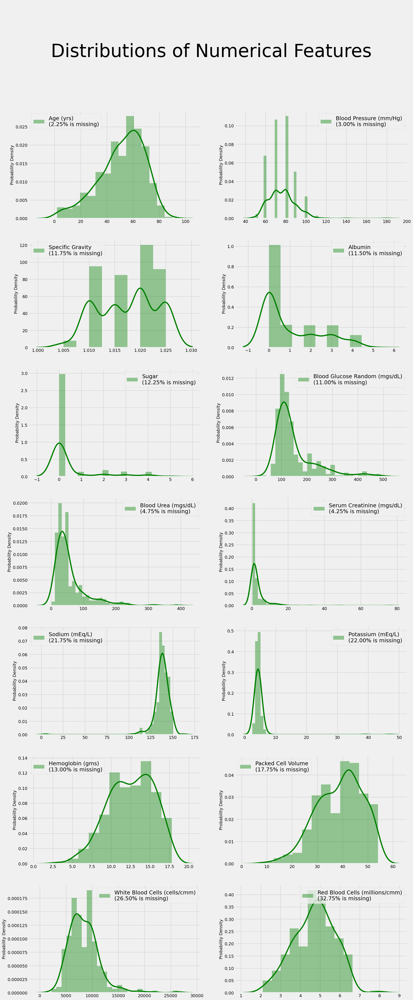

In [21]:
n_rows, n_cols = (7,2)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(20, 50))
figure.suptitle('\n\nDistributions of Numerical Features', fontsize=60)

for index, column in enumerate(numeric):

    i,j = (index // n_cols), (index % n_cols)

    miss_perc="%.2f"%(100*(1-(data[column].dropna().shape[0])/data.shape[0]))

    collabel=column+"\n({}% is missing)".format(miss_perc)

    fig=sns.distplot(data[column], color="g", label=collabel, norm_hist=True,

    ax=axes[i,j], kde_kws={"lw":4})

    fig=fig.legend(loc='best', fontsize=18)

    axes[i,j].set_ylabel("Probability Density",fontsize='medium')

    axes[i,j].set_xlabel(None)

plt.show()

In [23]:
style.use('seaborn-darkgrid')

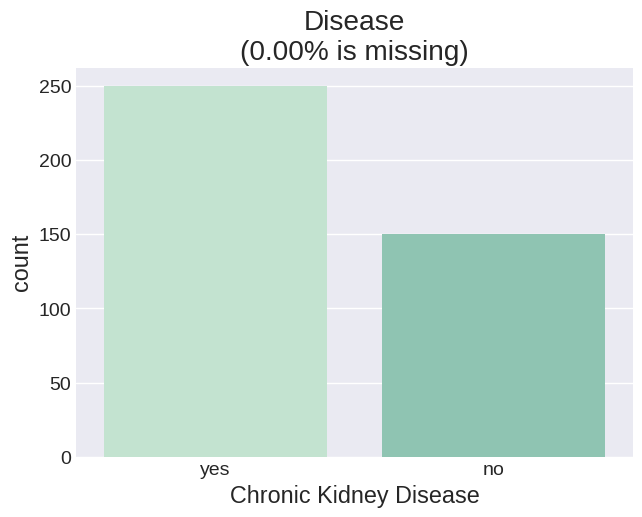

In [24]:
miss_perc="%.2f"%(100*(1-(data['Chronic Kidney Disease'].dropna().shape[0])/data.shape[0]))

label="Disease\n(missing:\n{}%)".format(miss_perc)
fig=sns.countplot(x=data['Chronic Kidney Disease'],label=label, palette=sns.cubehelix_palette(rot=-.35,light=0.85,hue=1))
plt.title("Disease\n({}% is missing)".format(miss_perc))
plt.show()

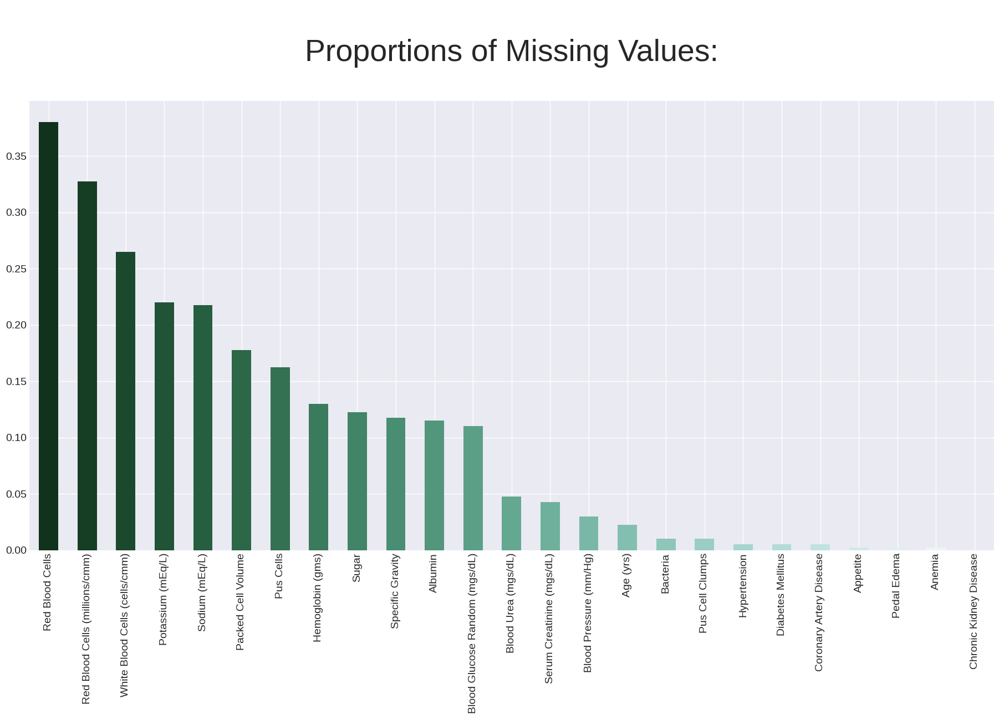

In [25]:
# checking Proportion of Missing Values
d=((data.isnull().sum()/data.shape[0])).sort_values(ascending=False)
d.plot(kind='bar',
       color=sns.cubehelix_palette(start=2,
                                    rot=0.15,
                                    dark=0.15,
                                    light=0.95,
                                    reverse=True,
                                    n_colors=24),
        figsize=(20,10))
plt.title("\nProportions of Missing Values:\n",fontsize=40)
plt.show()

In [27]:
onehotdata=pd.get_dummies(data,drop_first=True,prefix_sep=': ')
onehotdata.head()

,Age (yrs),Blood Pressure (mm/Hg),Specific Gravity,Albumin,Sugar,Blood Glucose Random (mgs/dL),Blood Urea (mgs/dL),Serum Creatinine (mgs/dL),Sodium (mEq/L),Potassium (mEq/L),...,Pus Cells: normal,Pus Cell Clumps: present,Bacteria: present,Hypertension: yes,Diabetes Mellitus: yes,Coronary Artery Disease: yes,Appetite: poor,Pedal Edema: yes,Anemia: yes,Chronic Kidney Disease: yes
0,48.0,80.0,1.020,1.0,0.0,121.0,36.0,1.2,NaN,NaN,...,True,False,False,True,True,False,False,False,False,True
1,7.0,50.0,1.020,4.0,0.0,NaN,18.0,0.8,NaN,NaN,...,True,False,False,False,False,False,False,False,False,True
2,62.0,80.0,1.010,2.0,3.0,423.0,53.0,1.8,NaN,NaN,...,True,False,False,False,True,False,True,False,True,True
3,48.0,70.0,1.005,4.0,0.0,117.0,56.0,3.8,111.0,2.5,...,False,True,False,True,False,False,True,True,True,True
4,51.0,80.0,1.010,2.0,0.0,106.0,26.0,1.4,NaN,NaN,...,True,False,False,False,False,False,False,False,False,True


In [1]:
# giving  all NaN (missing) values are now equal to 0.

In [29]:
names={}
for name in data.columns:
    for ohname in onehotdata.columns:
        if name+': ' in ohname and name in categoricals:
            names[name]=ohname
            for i in range(400):
                if type(data.loc[i,name])!=str:
                    if math.isnan(data.loc[i,name]):
                        onehotdata.loc[i,ohname]=data.loc[i,name]

In [30]:
test_oh_dt=pd.DataFrame(columns=data.columns)
for col in test_oh_dt.columns:
    if col in categoricals:
        test_oh_dt[col]=onehotdata[names[col]]
    elif col=='Chronic Kidney Disease':
        test_oh_dt[col]=onehotdata['Chronic Kidney Disease: yes']
    else:
        test_oh_dt[col]=onehotdata[col]

In [31]:
((pd.isna(data)==pd.isna(test_oh_dt))==False).sum()

Age (yrs)                         0
Blood Pressure (mm/Hg)            0
Specific Gravity                  0
Albumin                           0
Sugar                             0
Red Blood Cells                   0
Pus Cells                         0
Pus Cell Clumps                   0
Bacteria                          0
Blood Glucose Random (mgs/dL)     0
Blood Urea (mgs/dL)               0
Serum Creatinine (mgs/dL)         0
Sodium (mEq/L)                    0
Potassium (mEq/L)                 0
Hemoglobin (gms)                  0
Packed Cell Volume                0
White Blood Cells (cells/cmm)     0
Red Blood Cells (millions/cmm)    0
Hypertension                      0
Diabetes Mellitus                 0
Coronary Artery Disease           0
Appetite                          0
Pedal Edema                       0
Anemia                            0
Chronic Kidney Disease            0
dtype: int64

In [33]:
# Try With Few Different Transformations
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler

In [34]:
# The Quantile Transformer transforms a distribution into a normal or uniform one. We'll be trying both.
# The Power Transformer applies another non-linear transformation to make your data more normal-like.
# StandardScaler standardizes your features.
# RobustScaler centers data but, instead of dividing by the standard deviation, it divides by an inter-quantile range that can be specified.

In [35]:
NQT=QuantileTransformer(output_distribution='normal')
UQT=QuantileTransformer(output_distribution='uniform')
NSPT=PowerTransformer(standardize=False) #I'll feed its output to a normalizer and see if that makes any difference.
SPT=PowerTransformer()
RS=RobustScaler() #default
WRS=RobustScaler(quantile_range=(15,85)) # a "wider" range
SS=StandardScaler()

Transformers=[NQT,UQT,NSPT,SPT,RS,WRS,SS]
MMS=MinMaxScaler()

Pipes=[] #they're not actually pipelines, except for one,
#but initially I was going to normalize all of them, and didn't bother to change the name later
for tr in Transformers:
    p=make_pipeline(tr)
    Pipes.append(p)
Pipes[2]=make_pipeline(NSPT,MMS)

In [36]:
for pipe in Pipes:
    print(pipe)

Pipeline(steps=[('quantiletransformer',
                 QuantileTransformer(output_distribution='normal'))])
Pipeline(steps=[('quantiletransformer', QuantileTransformer())])
Pipeline(steps=[('powertransformer', PowerTransformer(standardize=False)),
                ('minmaxscaler', MinMaxScaler())])
Pipeline(steps=[('powertransformer', PowerTransformer())])
Pipeline(steps=[('robustscaler', RobustScaler())])
Pipeline(steps=[('robustscaler', RobustScaler(quantile_range=(15, 85)))])
Pipeline(steps=[('standardscaler', StandardScaler())])


In [37]:
datarrays=[]
for pipe in Pipes:
    arr=pipe.fit_transform(onehotdata)
    datarrays.append(arr)

In [38]:
dataframes=[onehotdata]
for arr in datarrays:
    df=pd.DataFrame(arr,columns=onehotdata.columns)
    dataframes.append(df)

In [39]:
# now we are seeing  How transformers will work to our data
categorical_feats=onehotdata.columns[14:]
numerical_feats=onehotdata.columns[:14]

In [40]:
style.use('fivethirtyeight')

In [41]:
colors=['crimson','steelblue','darkorange','darkviolet','gold','mediumblue','lime']

In [42]:
n_rows, n_cols = (14,8)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(70, 100))
figure.suptitle('\n\nDistributions of Numerical Features\nAfter Different Transformations', fontsize=120)
for i in range(14):
    fig = sns.distplot(onehotdata.iloc[:,i], color="g", label='Original\nDistribution', norm_hist=True,

    ax=axes[i,0], kde_kws={"lw":4})

    fig=fig.legend(loc='best', fontsize=35)

    axes[i,0].set_xlabel(axes[i,0].get_xlabel(),fontsize=33)

    axes[i,0].set_ylabel("Probability Density",fontsize=25)

for j in range(1,8):
    for i in range(14):
        label=Pipes[j-1].steps[0][0]

        fig = sns.distplot(dataframes[j].iloc[:,i], color=colors[j-1], label=label, norm_hist=True,

        ax=axes[i,j], kde_kws={"lw":4})

        fig=fig.legend(loc='best', fontsize=35)

        axes[i,j].set_ylabel("Probability Density",fontsize=25)

        axes[i,j].set_xlabel(axes[i,j].get_xlabel(),fontsize=33)

plt.show()

In [43]:
#Non-linear transformations (from red to purple) don't seem to have dealt with ordinal features well
#The gaussian quantile transformer (red) piled up outliers on the edges.
#Linear transformers (last three) didn't change shapes of distributions.

In [44]:
from sklearn.impute import KNNImputer
knnimp=KNNImputer(weights='distance', n_neighbors=8)
rrr=[onehotdata.to_numpy()]
for dfi in range(1,len(dataframes)):
    rrr.append(knnimp.fit_transform(dataframes[dfi]))
arrs=[rrr[0]]
for i in range(1,len(rrr)):
    arrs.append(Pipes[i-1].inverse_transform(rrr[i]))
impdf=[]
for i in range(len(arrs)):
    impdf.append(pd.DataFrame(arrs[i],columns=onehotdata.columns))

In [45]:
n_rows, n_cols = (14,8)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(70, 100))
figure.suptitle('\n\nDistributions of Numerical Features\nAfter Imputation', fontsize=120)
for i in range(14):
    fig = sns.distplot(onehotdata.iloc[:,i], color="g", label='Original Feature\n Distribution', norm_hist=True,

    ax=axes[i,0], kde_kws={"lw":4})

    fig=fig.legend(loc='best', fontsize=35)

    axes[i,0].set_xlabel(axes[i,0].get_xlabel(),fontsize=33)

    axes[i,0].set_ylabel("Probability Density",fontsize=25)

for j in range(1,8):
    for i in range(14):
        label=Pipes[j-1].steps[0][0]

        fig = sns.distplot(impdf[j].iloc[:,i], color=colors[j-1], label=label, norm_hist=True,

        ax=axes[i,j], kde_kws={"lw":4})

        fig=fig.legend(loc='best', fontsize=35)

        axes[i,j].set_ylabel("Probability Density",fontsize=25)

        axes[i,j].set_xlabel(axes[i,j].get_xlabel(),fontsize=33)

plt.show()

In [46]:
test=impdf.copy()
for j in range(1,8):
    dat=test[j]
    for i in range(14,25):
        col=dat.iloc[:,i]
        for k in range(400):
            if col[k]>=0.5:
                col[k]=1
            else:
                col[k]=0

In [47]:
impdf=test

In [48]:
fwmmv=list(numerical_feats.copy())
the_other_ones=['Age (yrs)','Blood Pressure (mm/Hg)','Serum Creatinine (mgs/dL)','Blood Urea (mgs/dL)']
for f in range(len(the_other_ones)):
    if the_other_ones[f] in fwmmv:
        fwmmv.remove(the_other_ones[f])
fwmmv.extend(('Red Blood Cells: normal','Pus Cells: normal'))

In [49]:
fwmmv #features with many missing values

['Specific Gravity',
 'Albumin',
 'Sugar',
 'Blood Glucose Random (mgs/dL)',
 'Sodium (mEq/L)',
 'Potassium (mEq/L)',
 'Hemoglobin (gms)',
 'Packed Cell Volume',
 'White Blood Cells (cells/cmm)',
 'Red Blood Cells (millions/cmm)',
 'Red Blood Cells: normal',
 'Pus Cells: normal']

In [50]:
indices=[1,6,7]

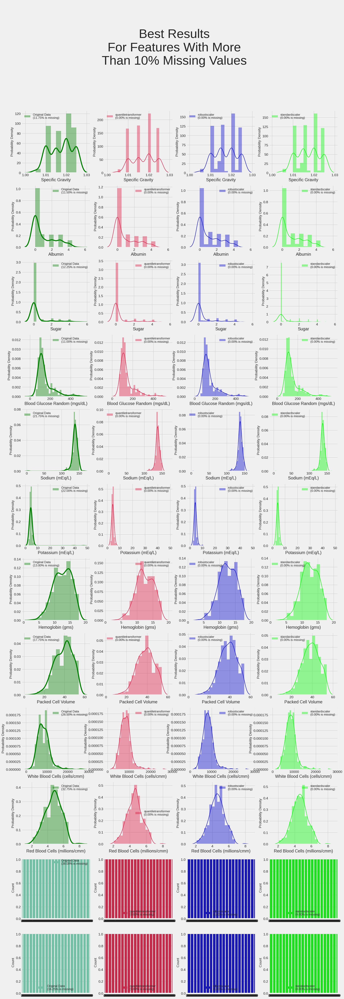

In [52]:
n_rows, n_cols = (12,4)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(20, 60))
figure.suptitle('\n\nBest Results\nFor Features With More\nThan 10% Missing Values', fontsize=50)

for index, column in enumerate(fwmmv):

    if index<10:

        miss_perc1="%.2f"%(100*(1-(onehotdata[column].dropna().shape[0])/onehotdata.shape[0]))

        collabel1='Original Data'+"\n({}% is missing)".format(miss_perc1)

        fig1=sns.distplot(onehotdata[column], color="g", label=collabel1, norm_hist=True,

        ax=axes[index,0], kde_kws={"lw":4})

        fig1=fig1.legend(loc='best', fontsize=12)

        axes[index,0].set_ylabel("Probability Density",fontsize='medium')

        for j in indices:

            miss_perc2="%.2f"%(100*(1-(impdf[j][column].dropna().shape[0])/impdf[j].shape[0]))

            collabel2=Pipes[j-1].steps[0][0]+"\n({}% is missing)".format(miss_perc2)

            fig2=sns.distplot(impdf[j][column], color=colors[j-1], label=collabel2, norm_hist=True,

            ax=axes[index,j-5+1], kde_kws={"lw":1.5})

            fig2=fig2.legend(loc='best', fontsize=12)

            axes[index,j-5+1].set_ylabel("Probability Density",fontsize='medium')
    else:

        miss_perc1="%.2f"%(100*(1-(onehotdata[column].dropna().shape[0])/onehotdata.shape[0]))

        collabel1='Original Data'+"\n({}% is missing)".format(miss_perc1)

        fig1=sns.countplot(onehotdata[column], color="mediumaquamarine", label=collabel1,

        ax=axes[index,0])

        fig1=fig1.legend(loc='best', fontsize=12)

        axes[index,0].set_ylabel("Count",fontsize='medium')

        for j in indices:

            miss_perc2="%.2f"%(100*(1-(impdf[j][column].dropna().shape[0])/impdf[j].shape[0]))

            collabel2=Pipes[j-1].steps[0][0]+"\n({}% is missing)".format(miss_perc2)

            fig2=sns.countplot(impdf[j][column], color=colors[j-1], label=collabel2,

            ax=axes[index,j-5+1])

            fig2=fig2.legend(loc='best', fontsize=12)

            axes[index,j-5+1].set_ylabel("Count",fontsize='medium')

plt.show()


In [53]:
onehotdata=impdf[1].copy()

In [54]:
onehotdata.dropna().shape

(400, 25)

In [55]:
# Explotatory Data Analysis
style.use('seaborn-darkgrid')

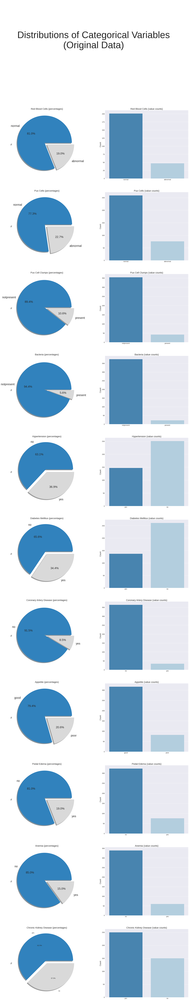

In [56]:
n_rows, n_cols = (11,2)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(25, 130))
figure.suptitle('\n\n\nDistributions of Categorical Variables\n(Original Data)', fontsize=80)

for i in range(len(categoricals)):
    column=categoricals[i]
    graph1=data[column].value_counts().plot.pie(autopct='%1.1f%%',
                                                      ax=axes[i,0],
                                                      colormap="tab20c",
                                                      fontsize=25,
                                                      shadow=True,
                                                      explode=[0.1,0])
    axes[i,0].set_ylabel('%')
    axes[i,0].set_title(column+' (percentages)')
    graph2=sns.countplot(x=column,
                         data=data,
                         palette='Blues_r',
                         ax=axes[i,1])
    axes[i,1].set_xlabel(None)
    axes[i,1].set_ylabel('Count')
    axes[i,1].set_xticklabels(axes[i,1].get_xticklabels())
    axes[i,1].set_title(column+' (value counts)')


graph1=data['Chronic Kidney Disease'].value_counts().plot.pie(autopct='%1.1f%%',
                                                              ax=axes[10,0],
                                                              colormap='tab20c',
                                                              shadow=True,
                                                              explode=[0.1,0])
axes[10,0].set_ylabel("%")
axes[10,0].set_title('Chronic Kidney Disease (percentages)')


graph2=sns.countplot(x='Chronic Kidney Disease',
                     data=data,
                     palette='Blues_r',
                     ax=axes[10,1])
axes[10,1].set_xlabel(None)
axes[10,1].set_ylabel("Count")
axes[10,1].set_xticklabels(axes[10,1].get_xticklabels())
axes[10,1].set_title('Chronic Kidney Disease (value counts)')

plt.show()

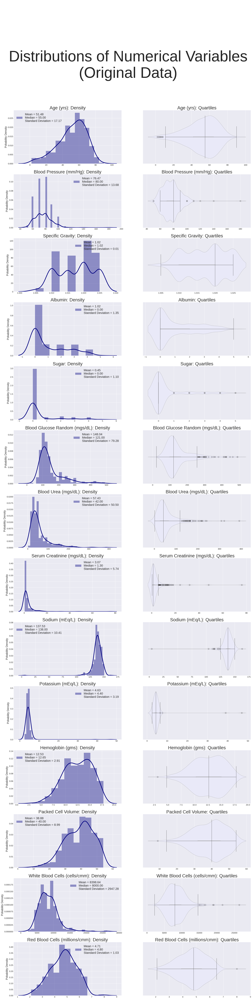

In [57]:
n_rows, n_cols = (14,2)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(25, 100))
figure.suptitle('\n\n\nDistributions of Numerical Variables\n(Original Data)', fontsize=100)

for i in range(len(numeric)):
    col=numeric[i]

    label='Mean = {}\nMedian = {}\nStandard Deviation = {}'.format("%.2f"%data[col].mean(),
                                                                    "%.2f"%data[col].median(),
                                                                    "%.2f"%data[col].std())

    graph1=sns.distplot(data[col],
                        color="navy",
                        ax=axes[i,0],
                        kde_kws={"lw":4},
                        norm_hist=True,
                        label=label).legend(loc='best',fontsize=20)
    axes[i,0].set_title(col+': Density',fontsize=30)
    axes[i,0].set_xlabel(None)
    axes[i,0].set_ylabel("Pobability Density",fontsize=18)

    graph20=sns.violinplot(x=col,
                          data=data,
                          ax=axes[i,1],
                          color='lavender',
                          inner='box')
    graph21=sns.boxplot(x=col,
                        data=data,
                        ax=axes[i,1],
                        fliersize=8,
                        boxprops=dict(alpha=0))

    axes[i,1].set_xlabel(None)
    axes[i,1].set_title(col+': Quartiles',fontsize=30)


plt.show()

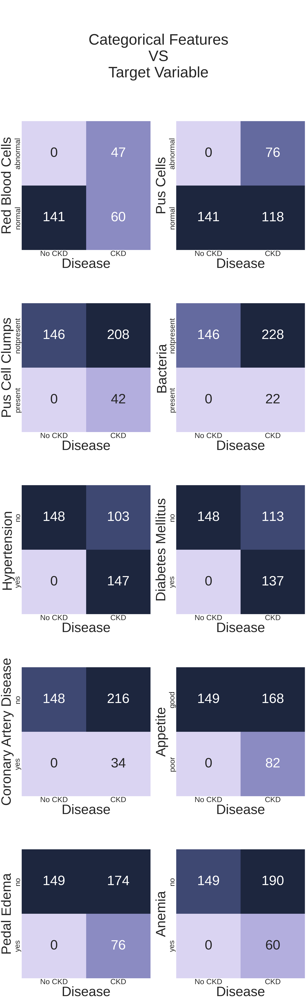

In [58]:
#  Co relation Matrix

n_rows, n_cols = (5,2)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(30, 100))
figure.suptitle('\n\nCategorical Features\nVS\nTarget Variable', fontsize=100)

for index, column in enumerate(categoricals):

    i,j = (index // n_cols), (index % n_cols)

    sns.heatmap(pd.crosstab(data[column],data['Chronic Kidney Disease']),
                ax=axes[i,j],
                cmap=sns.cubehelix_palette(start=2.8, rot=.1),
                square='True',
                cbar=False,
                annot=True,
                annot_kws={'fontsize':90},
                fmt='d')

    axes[i,j].set_xlabel("Disease", fontsize=90)

    axes[i,j].set_ylabel(column,fontsize=90)

    axes[i,j].set_yticklabels(axes[i,j].get_yticklabels(),fontsize=50)

    axes[i,j].set_xticklabels(["No CKD","CKD"],fontsize=50)

plt.show()


In [59]:
#Clustering & Prediction


In [60]:
X=onehotdata.drop("Chronic Kidney Disease: yes",axis=1,inplace=False)
Y=onehotdata["Chronic Kidney Disease: yes"]

In [61]:
full_scaled_data=SS.fit_transform(onehotdata)
scaled_data=SS.fit_transform(X)

In [62]:
from sklearn.cluster import KMeans

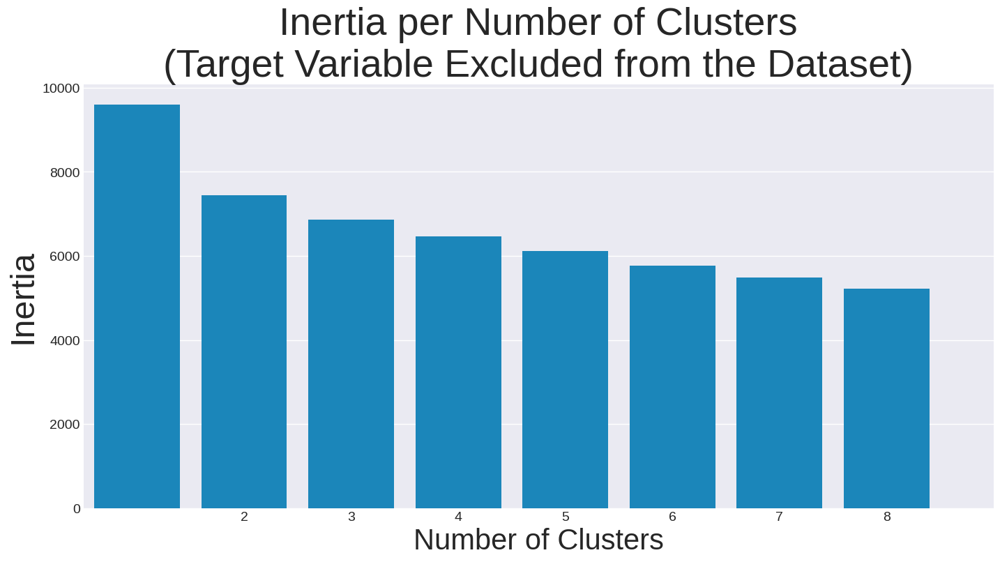

In [63]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

inertias = []
ks = list(range(1, 9))

for k in ks:
    model = KMeans(n_clusters=k)
    model.fit(scaled_data)
    inertias.append(model.inertia_)

plt.figure(figsize=(15, 7.5))
sns.barplot(x=ks, y=inertias)
plt.xlabel('Number of Clusters', fontsize=30)
plt.ylabel('Inertia', fontsize=35)
plt.xticks(ks)
plt.title("Inertia per Number of Clusters\n(Target Variable Excluded from the Dataset)", fontsize=40)
plt.show()


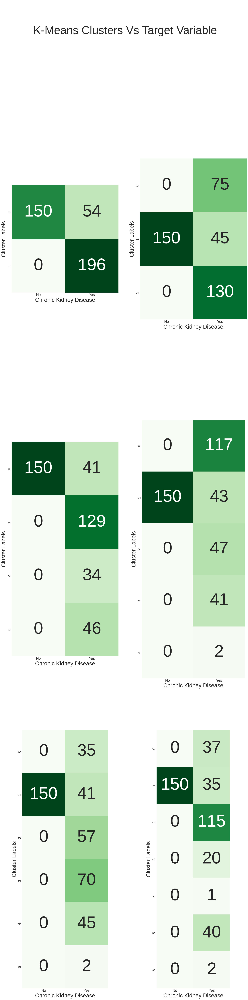

In [64]:
n_rows, n_cols = (3,2)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(20, 80))
figure.suptitle('\n\nK-Means Clusters Vs Target Variable', fontsize=60)

for index in range(6):

    i,j = (index // n_cols), (index % n_cols)

    model=KMeans(n_clusters=index+2)

    model.fit(scaled_data)

    cluster_labels=model.predict(scaled_data)

    sns.heatmap(pd.crosstab(cluster_labels,Y),
                ax=axes[i,j],
                cmap='Greens',
                square='True',
                cbar=False,
                annot=True,
                annot_kws={'fontsize':90},
                fmt='d')

    axes[i,j].set_xlabel("Chronic Kidney Disease",fontsize=30)

    axes[i,j].set_ylabel("Cluster Labels",fontsize=30)

    axes[i,j].set_yticklabels(axes[i,j].get_yticklabels(),fontsize=20)

    axes[i,j].set_xticklabels(["No","Yes"],fontsize=20)
plt.show()

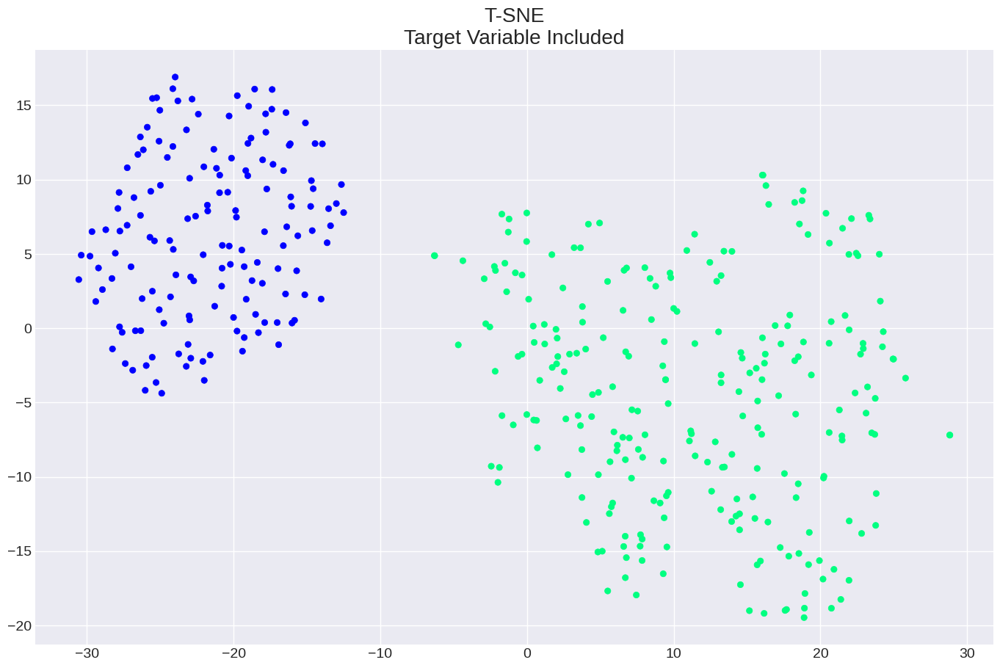

In [66]:
# Now we  Checking T-SNE
from sklearn.manifold import TSNE
tsne_model = TSNE()
tsne_data= tsne_model.fit_transform(full_scaled_data)
xs=tsne_data[:,0]
ys=tsne_data[:,1]
plt.figure(figsize=(15,10))
plt.scatter(xs,ys,c=pd.get_dummies(onehotdata['Chronic Kidney Disease: yes'],drop_first=True).values,cmap="winter")
plt.title("T-SNE\nTarget Variable Included")
plt.show()

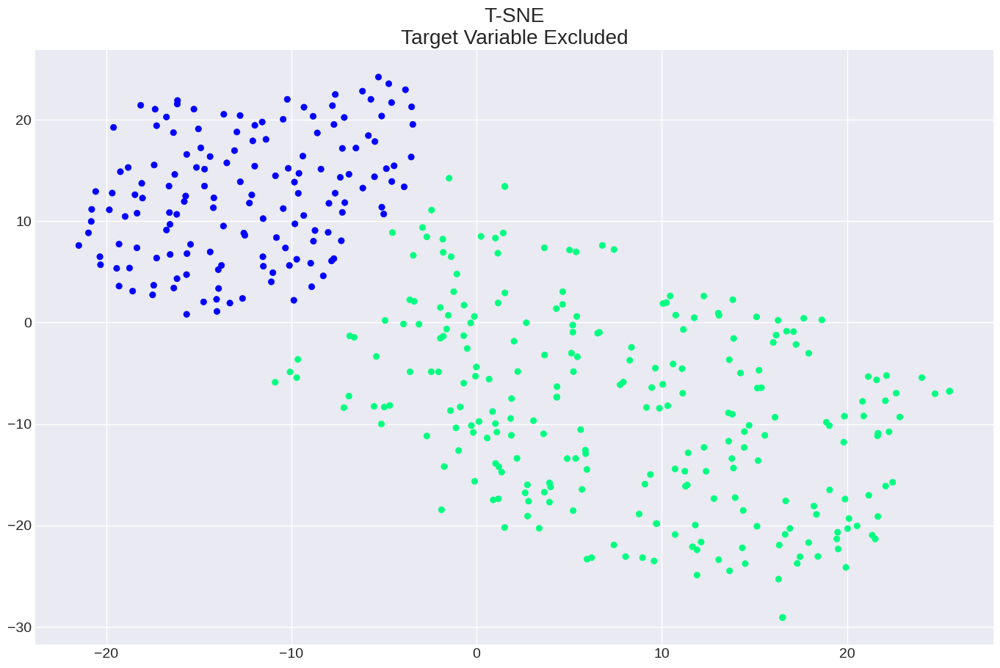

In [67]:
tsne_data= tsne_model.fit_transform(scaled_data)
xs=tsne_data[:,0]
ys=tsne_data[:,1]
plt.figure(figsize=(15,10))
plt.scatter(xs,ys,c=pd.get_dummies(Y,drop_first=True).values,cmap="winter")
plt.title("T-SNE\nTarget Variable Excluded")
plt.show()

In [68]:
# PCA Principal Component Analysis
from sklearn.decomposition import PCA
pca = PCA()
pca.fit(scaled_data)

PCA()

In [69]:
pca_features=list(range(1,25))

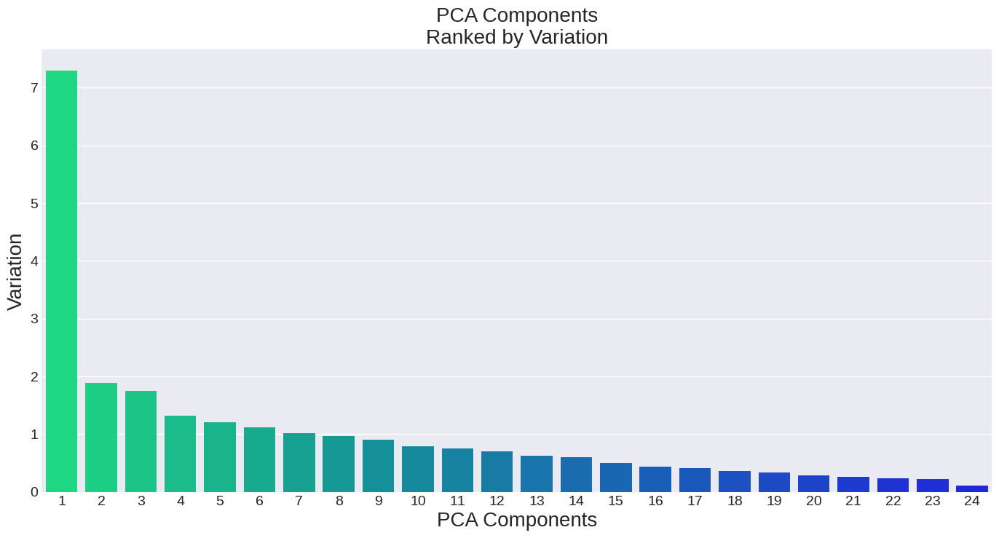

In [70]:
ax=plt.figure(figsize=(15,7.5))
sns.barplot(x=pca_features,y=pca.explained_variance_,palette="winter_r")
plt.ylabel('Variation',fontsize=20)
plt.xlabel('PCA Components',fontsize=20)
plt.title("PCA Components\nRanked by Variation")
plt.show()

In [71]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(scaled_data, Y, test_size=0.4, random_state=12)

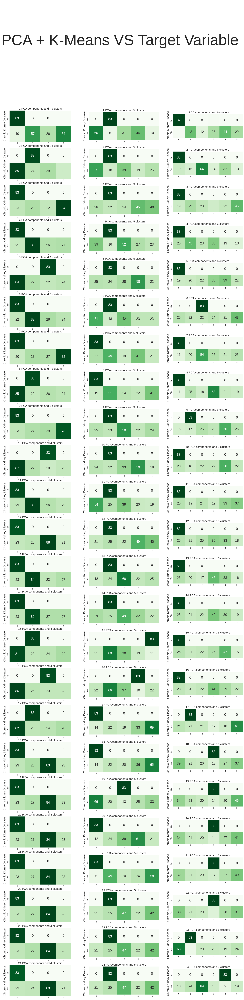

In [72]:
n_rows, n_cols = (24,3)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(20, 80))

figure.suptitle('\n\nPCA + K-Means VS Target Variable\n', fontsize=80)

for index in range(72):

    i,j = (index // n_cols), (index % n_cols)

    pca = PCA(n_components=i+1)

    pca_data=pca.fit_transform(X_train)

    model=KMeans(n_clusters=j+4, random_state=5) #random_state is arbitrary,
                                                    #I just fixed it to make sure I always get the same results

    model.fit(pca_data)

    cluster_labels=model.predict(pca_data)

    sns.heatmap(pd.crosstab(Y_train,cluster_labels),
                ax=axes[i,j],
                cmap='Greens',
                square='True',
                cbar=False,
                annot=True,
                annot_kws={'fontsize':18},
                fmt='d')

    axes[i,j].set_title("{} PCA components and {} clusters".format(i+1,j+4),fontsize=15)

    axes[i,j].set_ylabel("Chronic Kidney Disease",fontsize=15)

    axes[i,j].set_xlabel(None)

    axes[i,j].set_xticklabels(axes[i,j].get_xticklabels(),fontsize=10)

    axes[i,j].set_yticklabels(["No","Yes"],fontsize=10)

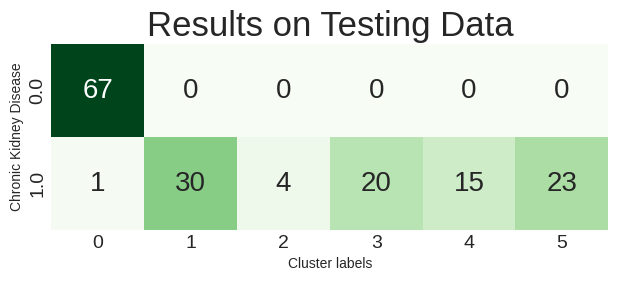

In [73]:
#Testing the data

pca = PCA(n_components=1)

pca_training_data=pca.fit_transform(X_train)

model=KMeans(n_clusters=6, random_state=5)

model.fit(pca_training_data)

pca_testing_data=pca.transform(X_test)

cluster_labels=model.predict(pca_testing_data)

sns.heatmap(pd.crosstab(Y_test,cluster_labels),
                cmap='Greens',
                square='True',
                cbar=False,
                annot=True,
                annot_kws={'fontsize':20},
                fmt='d')

plt.title("Results on Testing Data",fontsize=25)
plt.ylabel("Chronic Kidney Disease",fontsize=10)
plt.xlabel("Cluster labels",fontsize=10)
plt.show()

In [74]:
test=pd.crosstab(Y_test,cluster_labels)

In [75]:
test.columns

Index([0, 1, 2, 3, 4, 5], dtype='int32', name='col_0')

In [76]:
test

col_0,0,1,2,3,4,5
Chronic Kidney Disease: yes,,,,,,
0.0,67,0,0,0,0,0
1.0,1,30,4,20,15,23


In [77]:
a=test.iloc[1, 1:].sum()+test.iloc[0,0]

In [78]:
b=test.iloc[0,:].sum()+test.iloc[1,:].sum()

In [79]:
testaccuracy=a/b

In [80]:
print("Accuracy with KMEANs:",testaccuracy)

Accuracy with KMEANs: 0.99375
